In [1]:
import pickle
import torch
from tqdm import tqdm
from minf.data import FieldPDBDataset
from minf.models import Autoencoder, SirenNet, Decoder, SirenNetUnbatched
from minf.utils import plot_field
from torch.utils.data import DataLoader
import numpy as np
import yt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import pandas as pd

from rdkit import Chem
from rdkit.Chem import rdMolDescriptors

In [30]:
resolution = 32
rotation = 270

fd = FieldPDBDataset("../data/1osl.pdb", resolution=resolution, single_property=9)
dl = DataLoader(fd, batch_size=1, shuffle=True)
dl_test = DataLoader(fd, batch_size=1, shuffle=False)

yt : [INFO     ] 2025-02-12 00:06:41,986 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:41,987 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:41,987 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:41,987 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:41,987 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:42,034 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:42,041 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:42,042 Creating volume
yt : [INFO     ] 2025-02-12 00:06:42,059 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:42,059 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


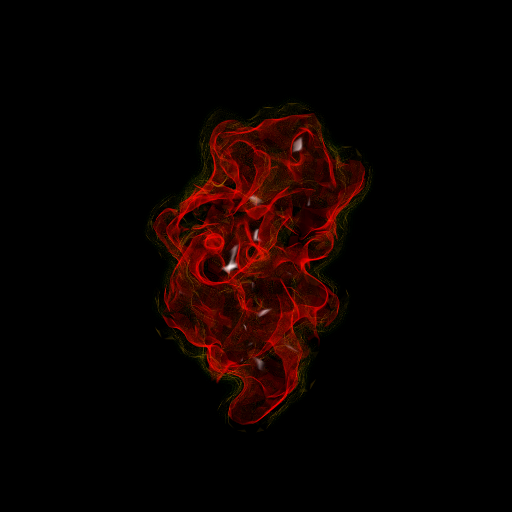

yt : [INFO     ] 2025-02-12 00:06:42,223 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:42,223 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:42,223 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:42,223 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:42,223 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:42,266 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:42,272 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:42,273 Creating volume
yt : [INFO     ] 2025-02-12 00:06:42,289 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:42,289 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


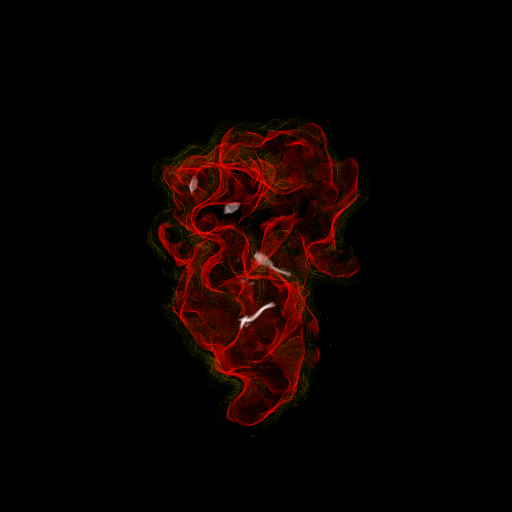

yt : [INFO     ] 2025-02-12 00:06:42,449 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:42,450 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:42,450 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:42,450 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:42,451 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:42,492 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:42,499 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:42,500 Creating volume
yt : [INFO     ] 2025-02-12 00:06:42,515 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:42,516 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


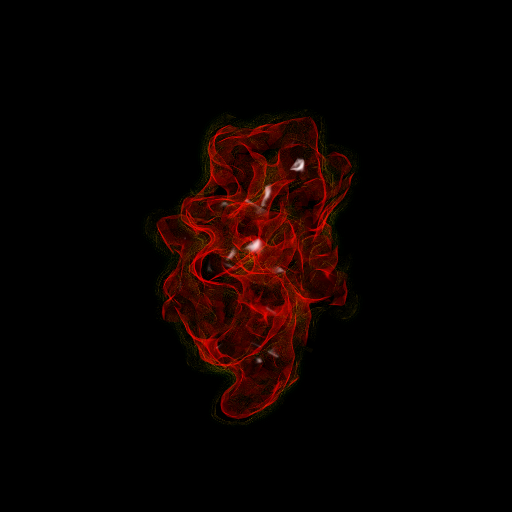

yt : [INFO     ] 2025-02-12 00:06:42,664 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:42,664 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:42,665 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:42,665 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:42,666 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:42,707 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:42,713 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:42,714 Creating volume
yt : [INFO     ] 2025-02-12 00:06:42,730 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:42,730 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


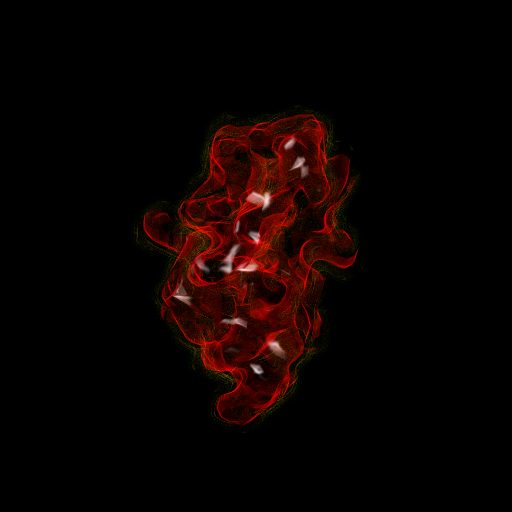

yt : [INFO     ] 2025-02-12 00:06:42,891 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:42,892 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:42,892 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:42,892 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:42,892 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:42,934 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:42,941 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:42,942 Creating volume
yt : [INFO     ] 2025-02-12 00:06:42,958 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:42,958 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


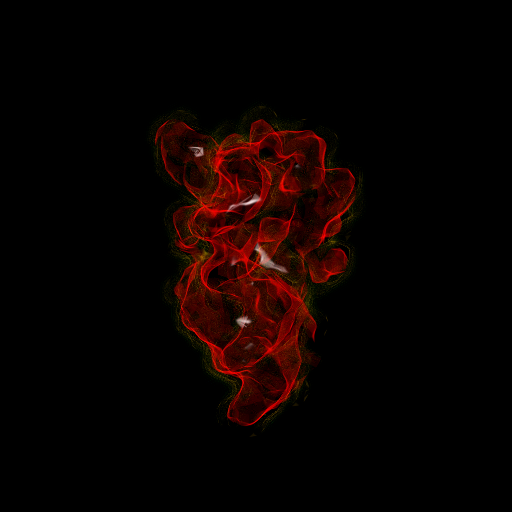

yt : [INFO     ] 2025-02-12 00:06:43,109 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:43,110 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:43,110 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:43,110 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:43,110 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:43,152 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:43,158 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:43,159 Creating volume
yt : [INFO     ] 2025-02-12 00:06:43,174 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:43,175 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


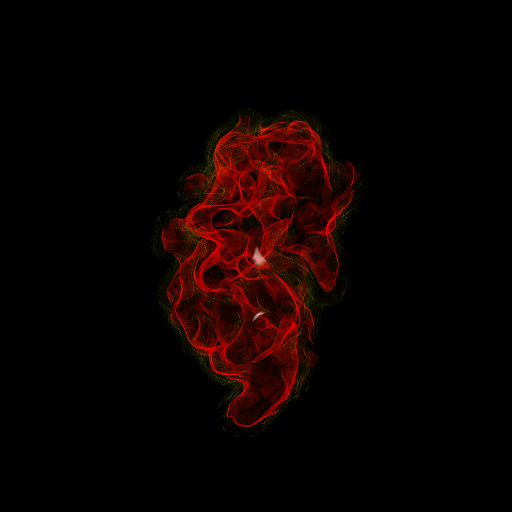

yt : [INFO     ] 2025-02-12 00:06:43,325 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:43,325 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:43,325 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:43,325 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:43,325 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:43,366 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:43,372 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:43,373 Creating volume
yt : [INFO     ] 2025-02-12 00:06:43,389 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:43,389 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


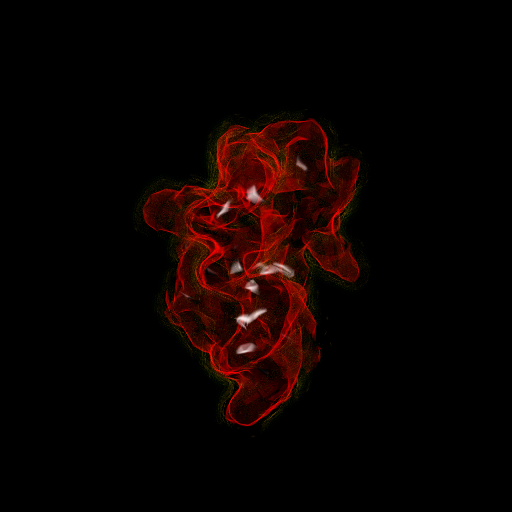

yt : [INFO     ] 2025-02-12 00:06:43,541 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:43,541 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:43,542 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:43,542 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:43,542 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:43,584 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:43,590 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:43,591 Creating volume
yt : [INFO     ] 2025-02-12 00:06:43,607 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:43,607 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


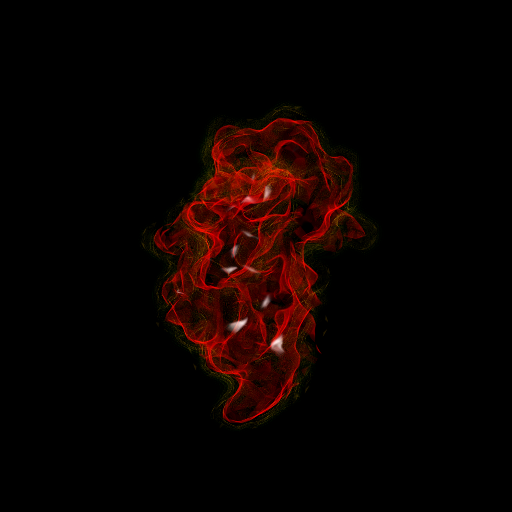

yt : [INFO     ] 2025-02-12 00:06:43,755 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:43,756 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:43,756 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:43,756 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:43,757 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:43,799 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:43,806 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:43,807 Creating volume
yt : [INFO     ] 2025-02-12 00:06:43,823 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:43,823 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


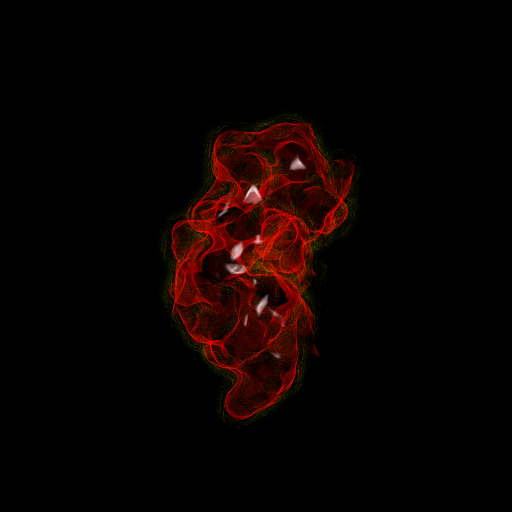

yt : [INFO     ] 2025-02-12 00:06:43,971 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:43,971 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:43,971 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:43,971 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:43,971 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:44,012 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:44,019 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:44,019 Creating volume
yt : [INFO     ] 2025-02-12 00:06:44,036 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:44,036 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


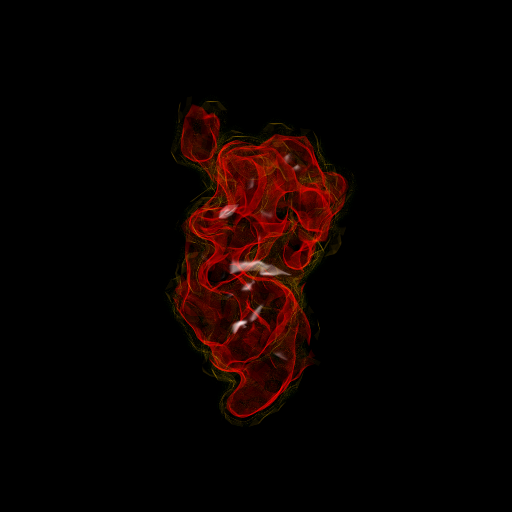

yt : [INFO     ] 2025-02-12 00:06:44,182 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:44,182 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:44,182 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:44,182 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:44,183 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:44,223 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:44,230 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:44,231 Creating volume
yt : [INFO     ] 2025-02-12 00:06:44,246 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:44,247 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


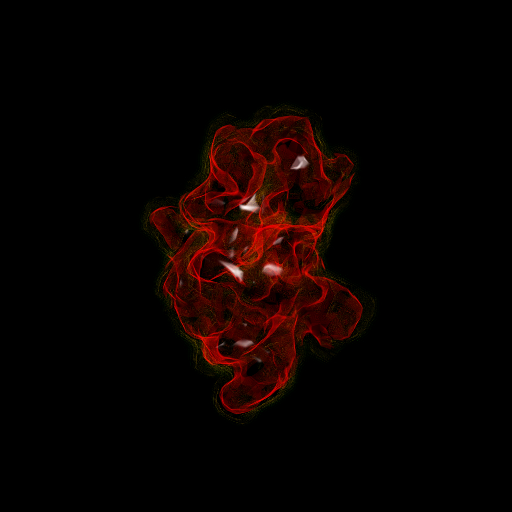

yt : [INFO     ] 2025-02-12 00:06:44,400 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:44,400 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:44,400 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:44,400 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:44,401 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:44,442 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:44,448 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:44,449 Creating volume
yt : [INFO     ] 2025-02-12 00:06:44,464 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:44,464 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


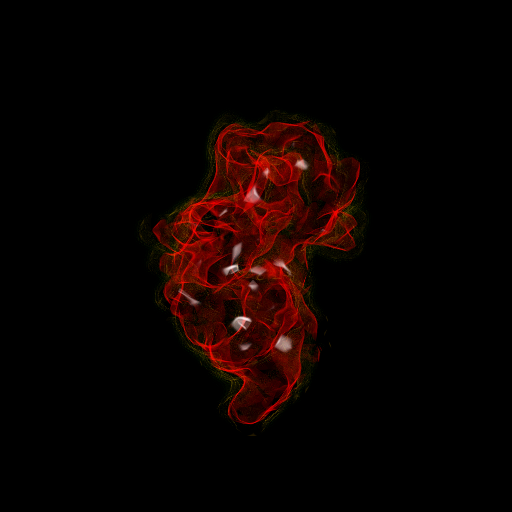

yt : [INFO     ] 2025-02-12 00:06:44,619 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:44,619 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:44,619 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:44,619 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:44,619 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:44,660 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:44,666 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:44,667 Creating volume
yt : [INFO     ] 2025-02-12 00:06:44,682 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:44,682 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


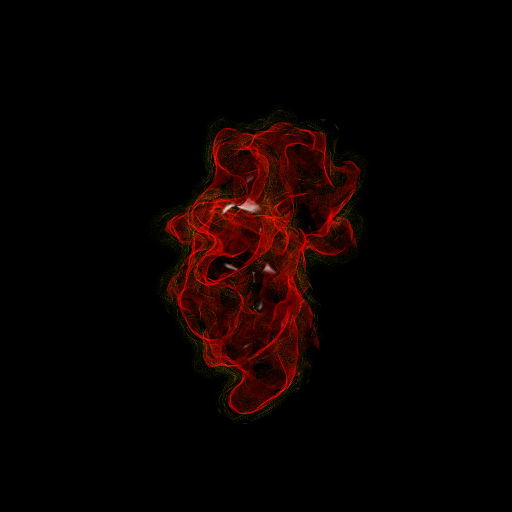

yt : [INFO     ] 2025-02-12 00:06:44,826 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:44,826 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:44,826 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:44,826 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:44,827 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:44,867 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:44,873 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:44,874 Creating volume
yt : [INFO     ] 2025-02-12 00:06:44,890 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:44,890 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


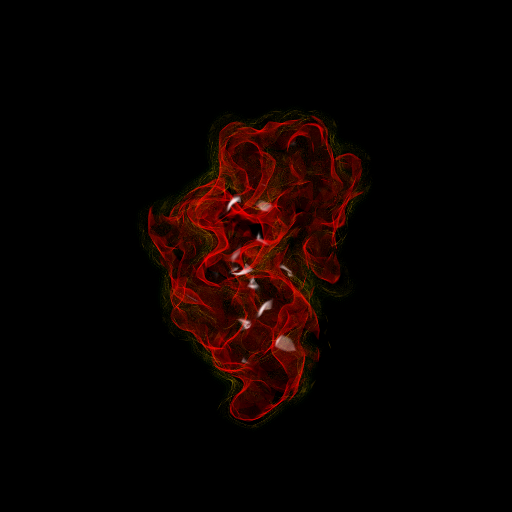

yt : [INFO     ] 2025-02-12 00:06:45,047 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:45,048 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:45,048 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:45,048 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:45,048 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:45,088 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:45,095 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:45,095 Creating volume
yt : [INFO     ] 2025-02-12 00:06:45,111 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:45,111 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


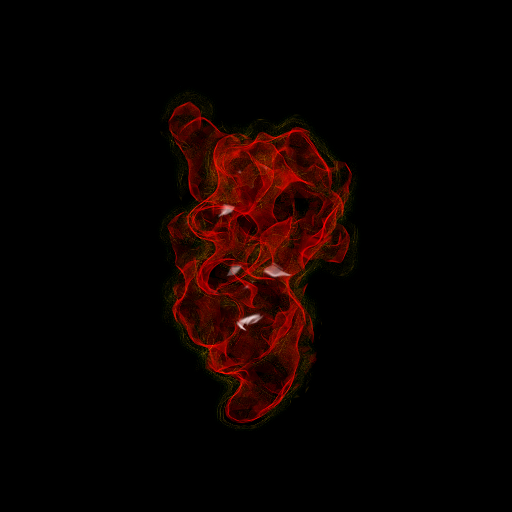

yt : [INFO     ] 2025-02-12 00:06:45,298 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:45,299 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:45,299 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:45,299 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:45,299 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:45,460 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:45,466 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:45,467 Creating volume
yt : [INFO     ] 2025-02-12 00:06:45,483 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:45,483 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


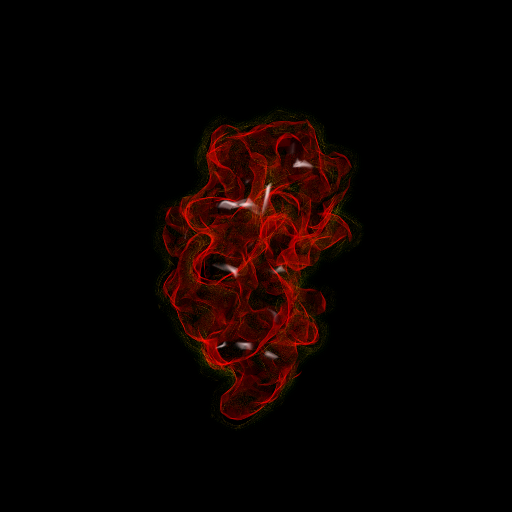

yt : [INFO     ] 2025-02-12 00:06:45,646 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:45,646 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:45,647 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:45,647 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:45,647 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:45,691 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:45,698 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:45,699 Creating volume
yt : [INFO     ] 2025-02-12 00:06:45,716 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:45,716 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


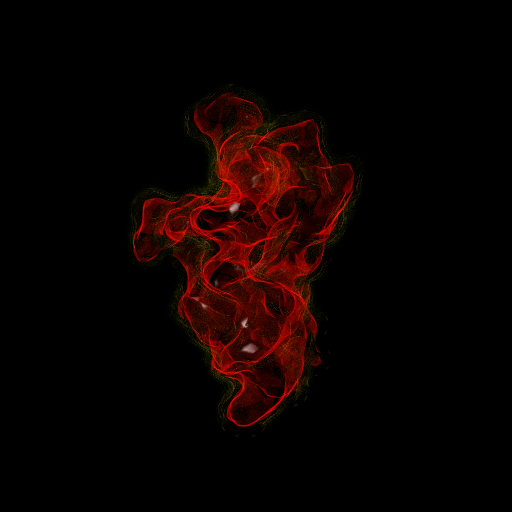

yt : [INFO     ] 2025-02-12 00:06:45,876 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:45,876 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:45,876 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:45,877 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:45,877 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:45,920 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:45,927 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:45,927 Creating volume
yt : [INFO     ] 2025-02-12 00:06:45,943 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:45,944 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


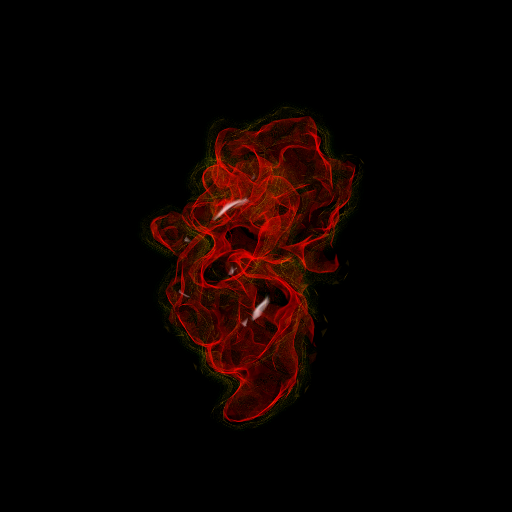

yt : [INFO     ] 2025-02-12 00:06:46,097 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:46,097 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:46,097 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:46,097 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:46,098 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:46,140 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:46,147 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:46,148 Creating volume
yt : [INFO     ] 2025-02-12 00:06:46,164 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:46,164 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


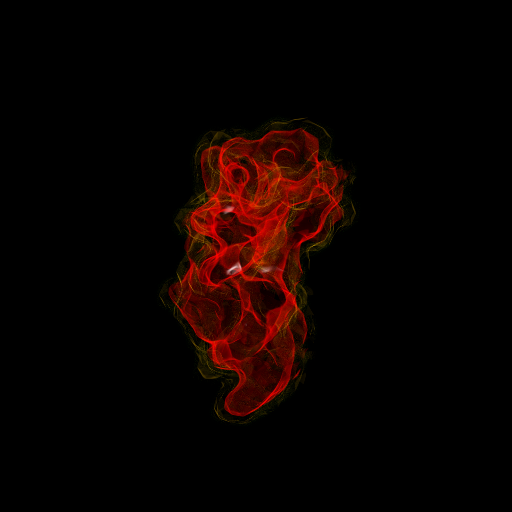

yt : [INFO     ] 2025-02-12 00:06:46,312 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:06:46,312 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:06:46,312 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:06:46,312 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:06:46,313 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:06:46,354 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:06:46,361 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:06:46,361 Creating volume
yt : [INFO     ] 2025-02-12 00:06:46,377 Creating transfer function
yt : [INFO     ] 2025-02-12 00:06:46,377 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


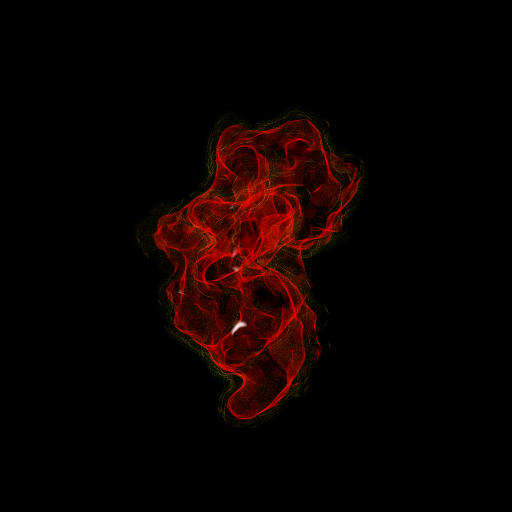

In [32]:
for batch in dl_test:
    for field in batch:
        plot_field(field[:, :, :, 0], cam_rotate=rotation).show()

In [33]:
net = SirenNet(
    dim_in=4,
    dim_hidden=256,
    dim_out=1,
    num_layers=8,
    w0 = 1.0,
    w0_initial = 30.0,
    use_bias = True,
    final_activation = None
)

autoencoder = Autoencoder(
    net,
    in_channels=1,
    output_shape=[resolution, resolution, resolution, 1, 1],
    latent_dim=256,
)

autoencoder.cuda()

optim = torch.optim.Adam(lr=1e-4, params=autoencoder.parameters())

/home/daenu/micromamba/envs/minf/lib/python3.11/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


In [ ]:
for epoch in (pbar := tqdm(range(10000))):
    total_loss = 0
    for batch in dl:
        loss, out, latent = autoencoder(batch.cuda())
        optim.zero_grad()
        loss.backward()
        optim.step()

        total_loss += loss.item()
    torch.save(autoencoder.state_dict(), "model.pt")
    pbar.set_description(f"Epoch {epoch} (loss: {(total_loss / len(fd)):2f})")

Epoch 189 (loss: 0.004243):   2%|█▎                                                                    | 190/10000 [01:25<1:13:47,  2.22it/s]

yt : [INFO     ] 2025-02-12 00:09:32,798 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:32,799 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:32,799 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:32,799 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:32,800 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:32,842 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:32,849 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:32,849 Creating volume
yt : [INFO     ] 2025-02-12 00:09:32,867 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:32,867 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


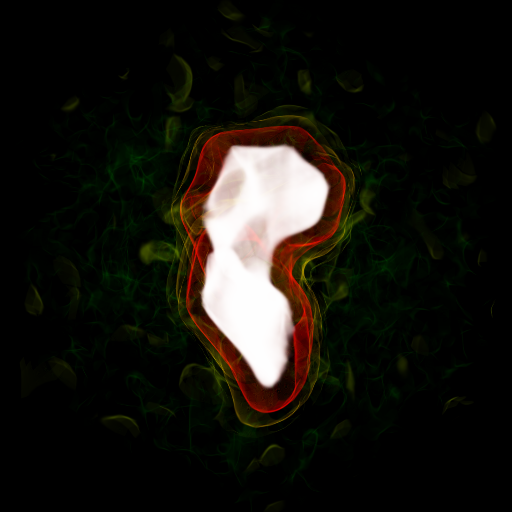

yt : [INFO     ] 2025-02-12 00:09:33,071 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:33,071 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:33,071 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:33,071 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:33,072 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:33,113 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:33,119 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:33,120 Creating volume
yt : [INFO     ] 2025-02-12 00:09:33,136 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:33,136 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


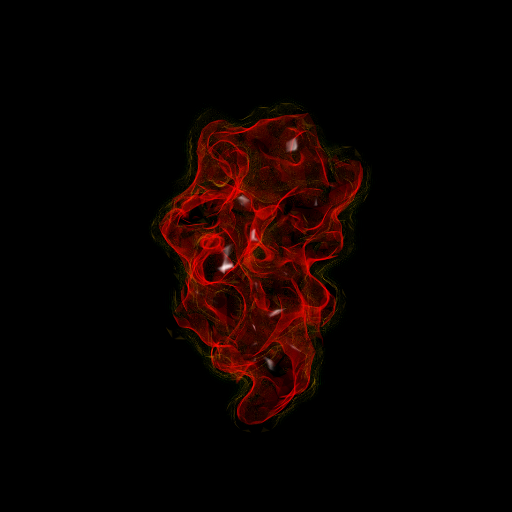

yt : [INFO     ] 2025-02-12 00:09:33,295 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:33,295 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:33,295 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:33,296 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:33,296 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:33,337 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:33,343 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:33,344 Creating volume
yt : [INFO     ] 2025-02-12 00:09:33,360 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:33,360 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


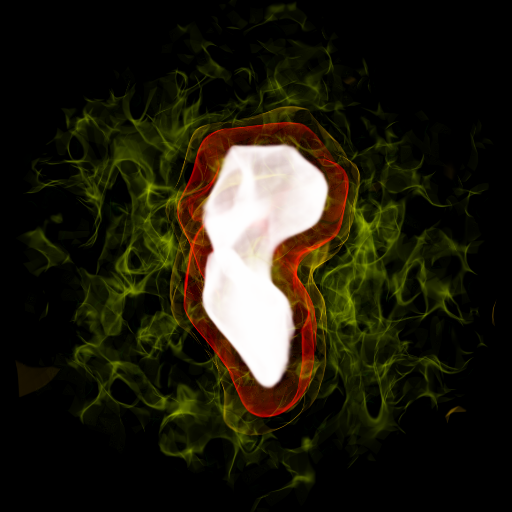

yt : [INFO     ] 2025-02-12 00:09:33,574 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:33,575 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:33,575 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:33,575 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:33,575 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:33,616 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:33,623 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:33,623 Creating volume
yt : [INFO     ] 2025-02-12 00:09:33,639 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:33,639 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


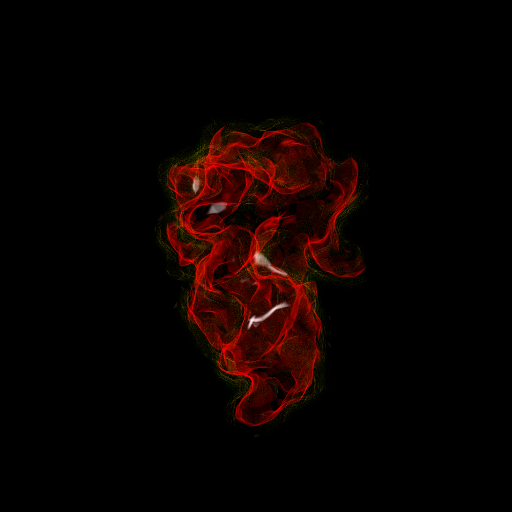

yt : [INFO     ] 2025-02-12 00:09:33,799 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:33,799 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:33,799 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:33,800 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:33,800 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:33,840 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:33,846 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:33,847 Creating volume
yt : [INFO     ] 2025-02-12 00:09:33,863 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:33,863 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


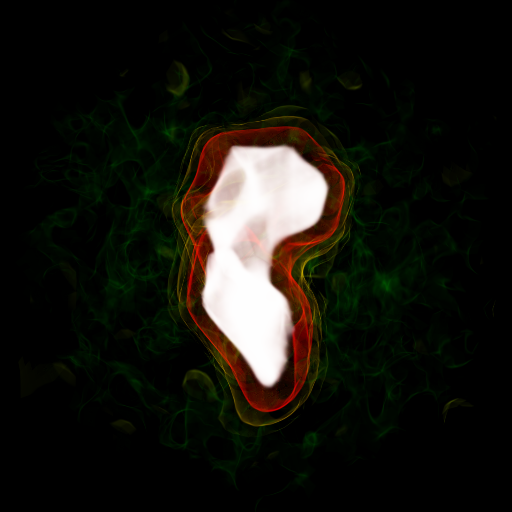

yt : [INFO     ] 2025-02-12 00:09:34,062 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:34,062 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:34,062 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:34,062 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:34,063 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:34,104 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:34,110 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:34,111 Creating volume
yt : [INFO     ] 2025-02-12 00:09:34,127 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:34,127 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


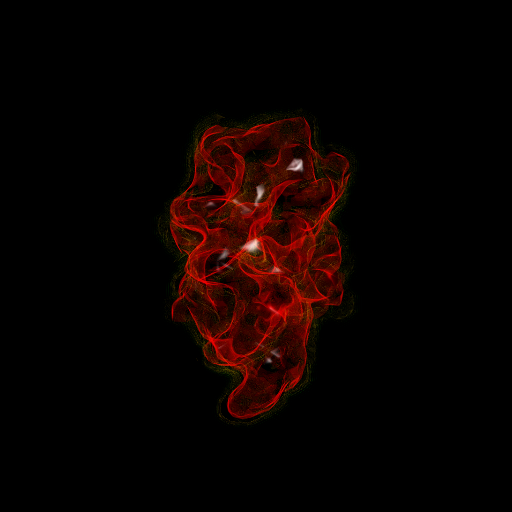

yt : [INFO     ] 2025-02-12 00:09:34,295 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:34,295 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:34,295 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:34,295 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:34,296 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:34,336 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:34,343 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:34,343 Creating volume
yt : [INFO     ] 2025-02-12 00:09:34,359 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:34,360 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


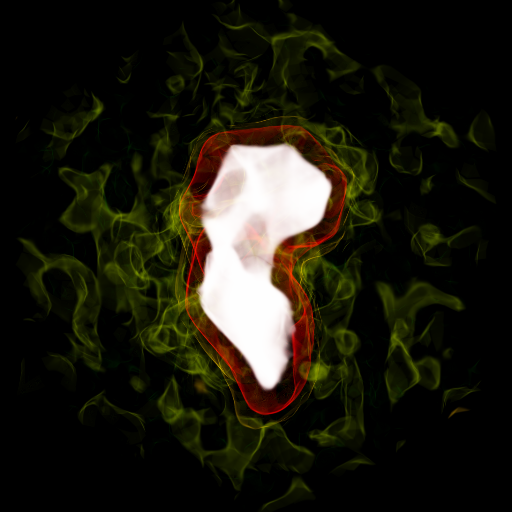

yt : [INFO     ] 2025-02-12 00:09:34,601 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:34,601 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:34,602 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:34,602 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:34,602 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:34,650 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:34,656 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:34,657 Creating volume
yt : [INFO     ] 2025-02-12 00:09:34,673 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:34,673 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


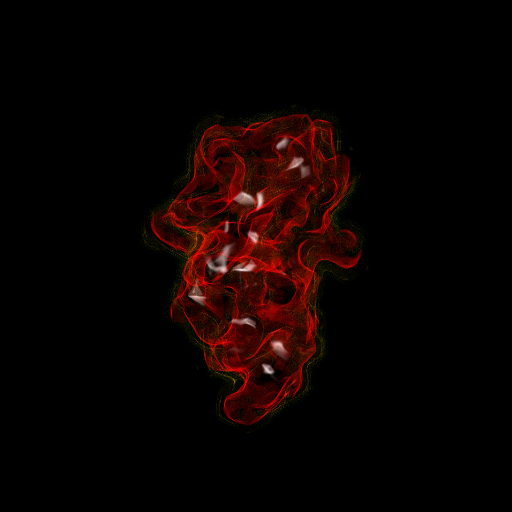

yt : [INFO     ] 2025-02-12 00:09:34,867 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:34,867 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:34,867 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:34,867 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:34,867 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:35,042 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:35,049 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:35,049 Creating volume
yt : [INFO     ] 2025-02-12 00:09:35,065 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:35,065 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


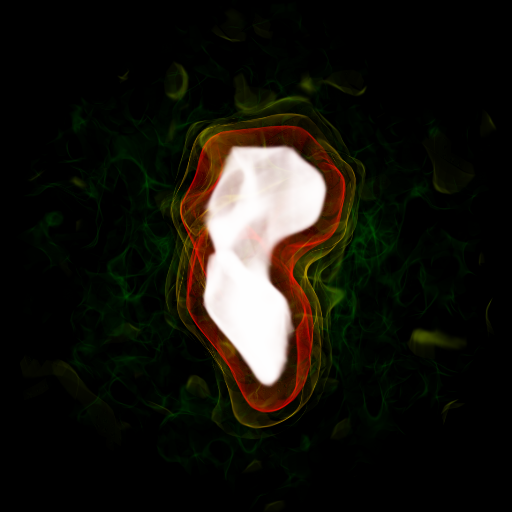

yt : [INFO     ] 2025-02-12 00:09:35,279 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:35,279 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:35,279 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:35,279 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:35,280 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:35,321 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:35,328 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:35,329 Creating volume
yt : [INFO     ] 2025-02-12 00:09:35,345 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:35,345 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


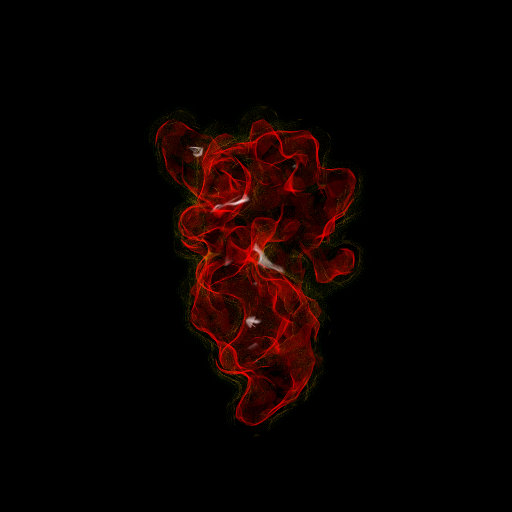

yt : [INFO     ] 2025-02-12 00:09:35,501 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:35,501 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:35,502 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:35,502 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:35,502 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:35,544 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:35,550 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:35,551 Creating volume
yt : [INFO     ] 2025-02-12 00:09:35,567 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:35,567 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


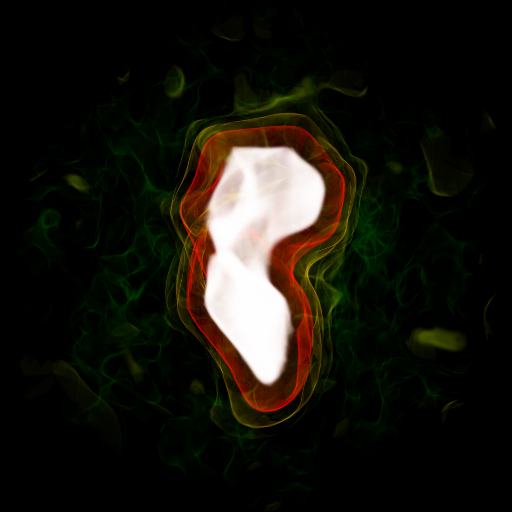

yt : [INFO     ] 2025-02-12 00:09:35,776 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:35,776 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:35,776 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:35,776 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:35,776 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:35,818 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:35,824 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:35,825 Creating volume
yt : [INFO     ] 2025-02-12 00:09:35,841 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:35,841 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


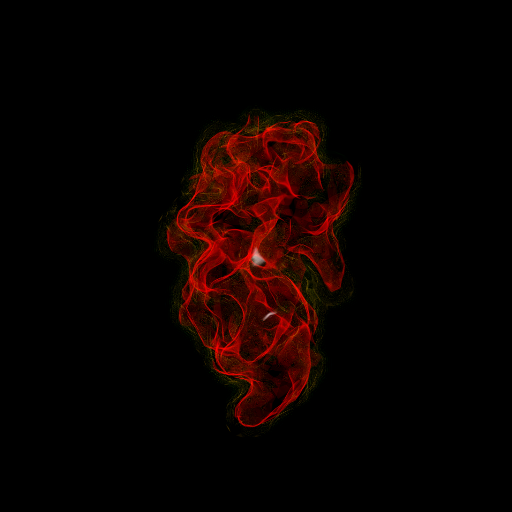

yt : [INFO     ] 2025-02-12 00:09:36,007 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:36,007 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:36,008 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:36,008 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:36,008 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:36,050 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:36,056 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:36,057 Creating volume
yt : [INFO     ] 2025-02-12 00:09:36,073 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:36,073 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


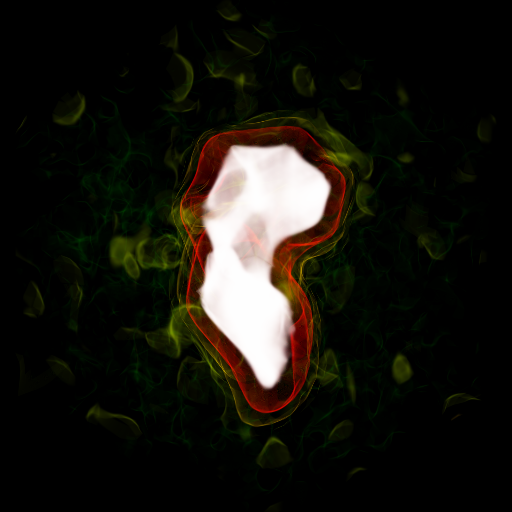

yt : [INFO     ] 2025-02-12 00:09:36,285 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:36,285 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:36,285 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:36,285 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:36,286 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:36,327 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:36,334 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:36,335 Creating volume
yt : [INFO     ] 2025-02-12 00:09:36,350 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:36,351 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


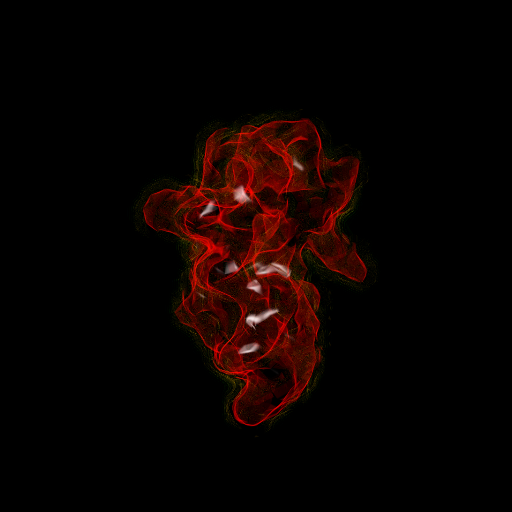

yt : [INFO     ] 2025-02-12 00:09:36,516 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:36,516 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:36,517 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:36,517 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:36,517 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:36,558 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:36,565 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:36,566 Creating volume
yt : [INFO     ] 2025-02-12 00:09:36,582 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:36,582 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


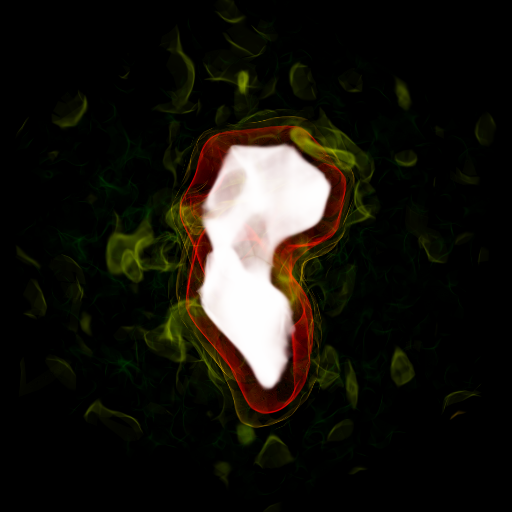

yt : [INFO     ] 2025-02-12 00:09:36,791 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:36,791 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:36,792 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:36,792 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:36,792 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:36,834 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:36,840 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:36,841 Creating volume
yt : [INFO     ] 2025-02-12 00:09:36,857 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:36,857 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


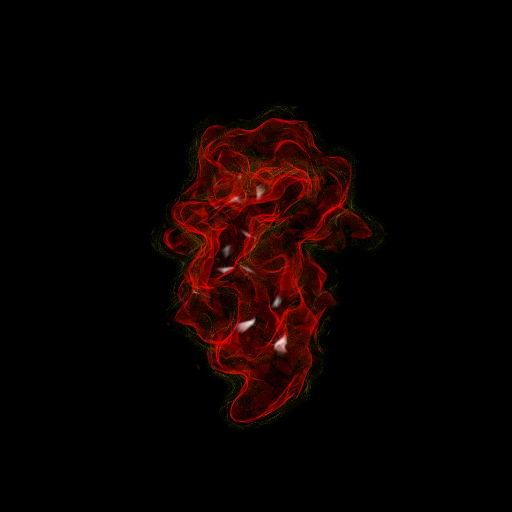

yt : [INFO     ] 2025-02-12 00:09:37,042 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:37,042 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:37,042 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:37,043 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:37,043 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:37,085 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:37,091 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:37,092 Creating volume
yt : [INFO     ] 2025-02-12 00:09:37,108 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:37,109 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


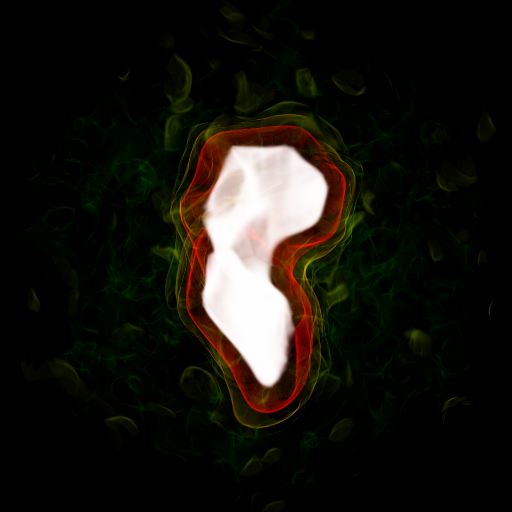

yt : [INFO     ] 2025-02-12 00:09:37,329 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:37,330 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:37,330 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:37,330 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:37,330 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:37,372 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:37,379 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:37,379 Creating volume
yt : [INFO     ] 2025-02-12 00:09:37,395 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:37,395 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


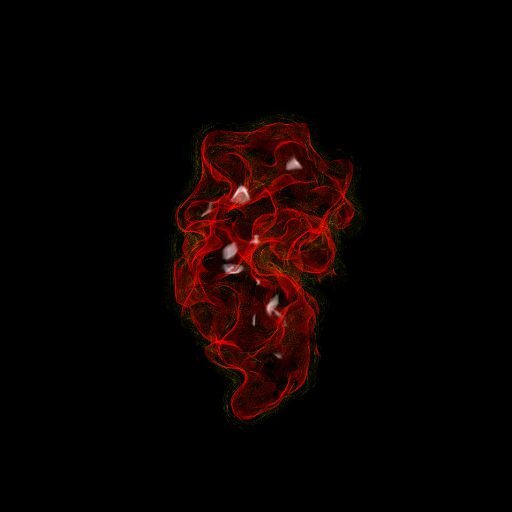

yt : [INFO     ] 2025-02-12 00:09:37,544 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:37,544 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:37,544 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:37,545 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:37,545 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:37,586 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:37,593 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:37,593 Creating volume
yt : [INFO     ] 2025-02-12 00:09:37,610 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:37,610 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


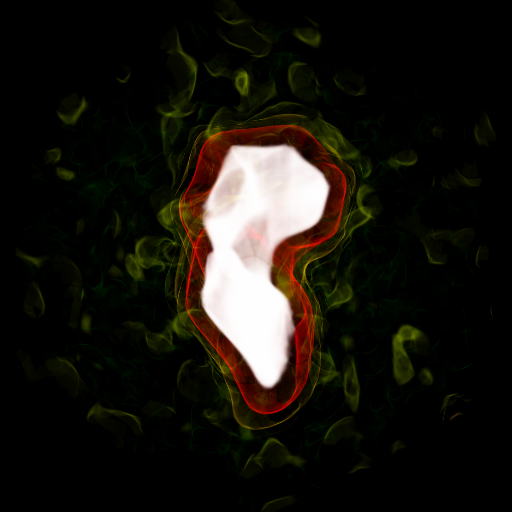

yt : [INFO     ] 2025-02-12 00:09:37,827 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:37,827 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:37,827 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:37,827 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:37,827 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:37,870 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:37,877 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:37,877 Creating volume
yt : [INFO     ] 2025-02-12 00:09:37,893 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:37,894 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


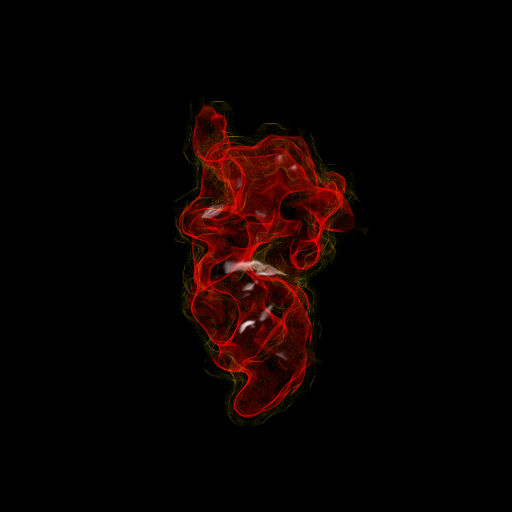

yt : [INFO     ] 2025-02-12 00:09:38,054 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:38,055 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:38,055 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:38,055 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:38,056 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:38,097 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:38,103 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:38,104 Creating volume
yt : [INFO     ] 2025-02-12 00:09:38,120 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:38,120 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


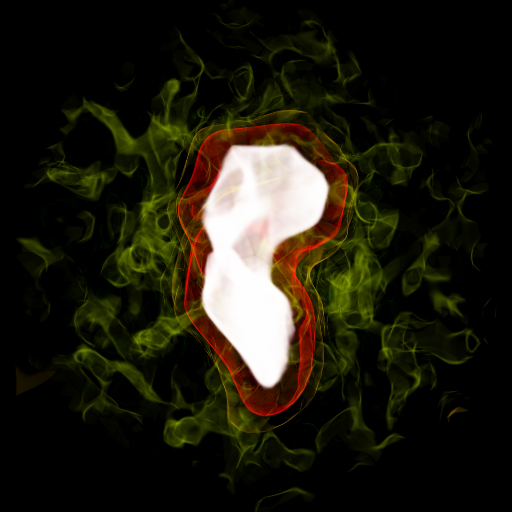

yt : [INFO     ] 2025-02-12 00:09:38,338 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:38,338 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:38,338 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:38,338 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:38,339 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:38,385 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:38,391 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:38,392 Creating volume
yt : [INFO     ] 2025-02-12 00:09:38,408 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:38,408 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


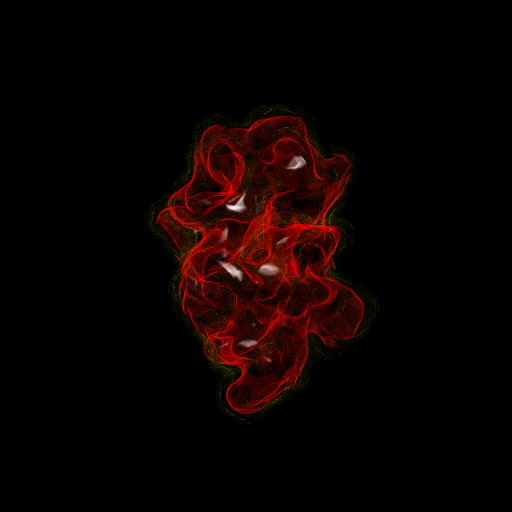

yt : [INFO     ] 2025-02-12 00:09:38,574 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:38,574 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:38,574 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:38,574 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:38,574 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:38,616 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:38,622 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:38,623 Creating volume
yt : [INFO     ] 2025-02-12 00:09:38,639 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:38,639 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


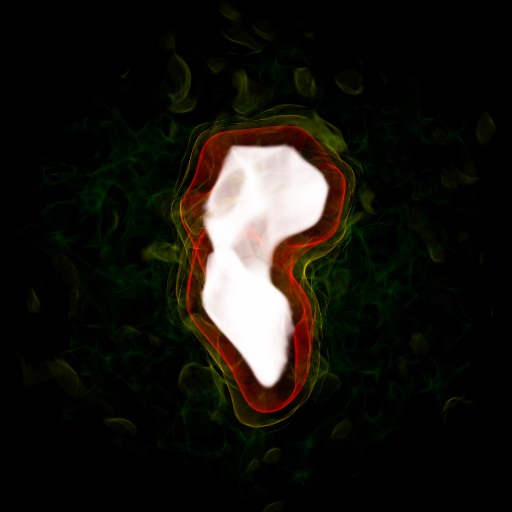

yt : [INFO     ] 2025-02-12 00:09:38,845 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:38,845 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:38,846 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:38,846 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:38,846 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:38,886 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:38,893 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:38,893 Creating volume
yt : [INFO     ] 2025-02-12 00:09:38,910 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:38,910 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


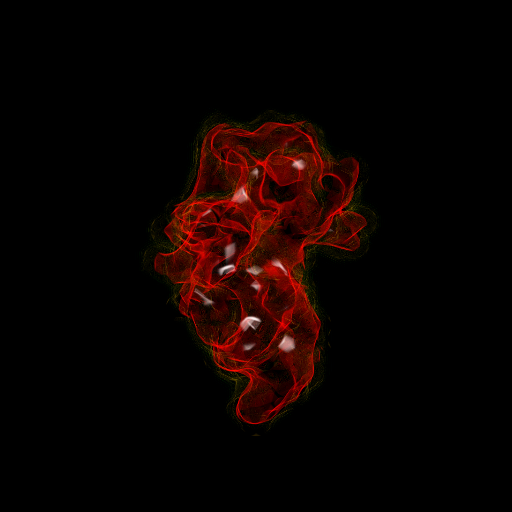

yt : [INFO     ] 2025-02-12 00:09:39,109 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:39,109 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:39,109 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:39,110 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:39,110 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:39,150 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:39,156 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:39,157 Creating volume
yt : [INFO     ] 2025-02-12 00:09:39,173 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:39,173 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


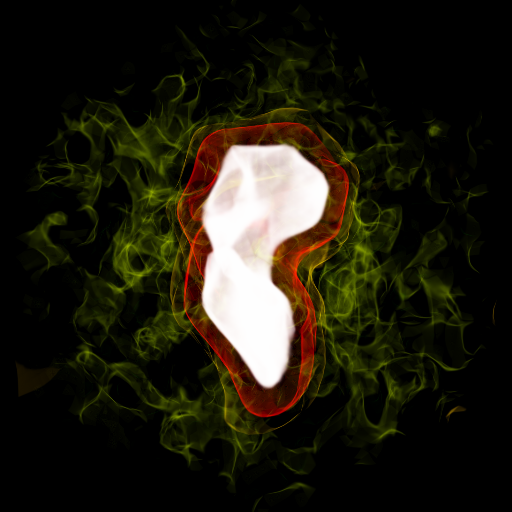

yt : [INFO     ] 2025-02-12 00:09:39,380 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:39,380 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:39,380 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:39,381 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:39,381 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:39,421 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:39,428 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:39,429 Creating volume
yt : [INFO     ] 2025-02-12 00:09:39,444 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:39,444 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


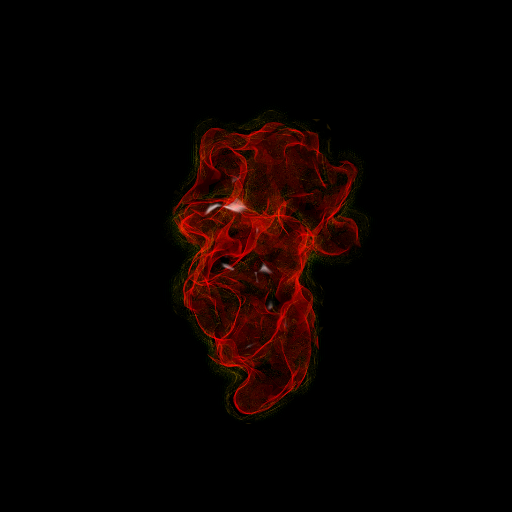

yt : [INFO     ] 2025-02-12 00:09:39,595 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:39,595 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:39,595 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:39,595 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:39,595 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:39,636 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:39,643 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:39,643 Creating volume
yt : [INFO     ] 2025-02-12 00:09:39,660 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:39,660 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


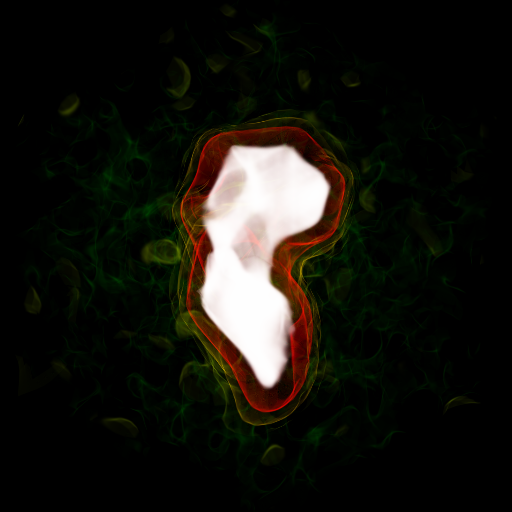

yt : [INFO     ] 2025-02-12 00:09:39,858 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:39,859 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:39,859 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:39,859 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:39,860 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:39,900 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:39,907 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:39,907 Creating volume
yt : [INFO     ] 2025-02-12 00:09:39,923 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:39,924 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


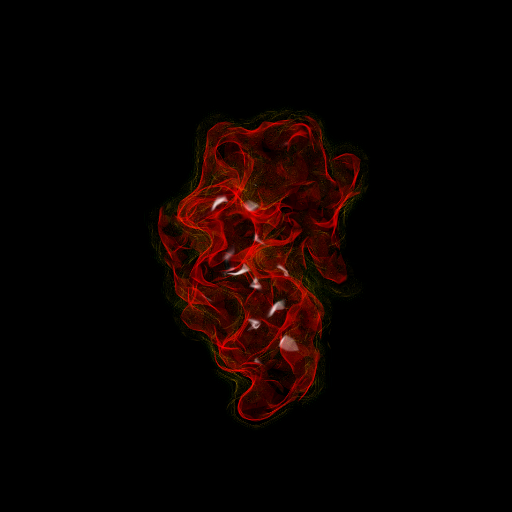

yt : [INFO     ] 2025-02-12 00:09:40,081 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:40,081 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:40,082 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:40,082 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:40,082 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:40,122 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:40,129 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:40,130 Creating volume
yt : [INFO     ] 2025-02-12 00:09:40,147 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:40,147 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


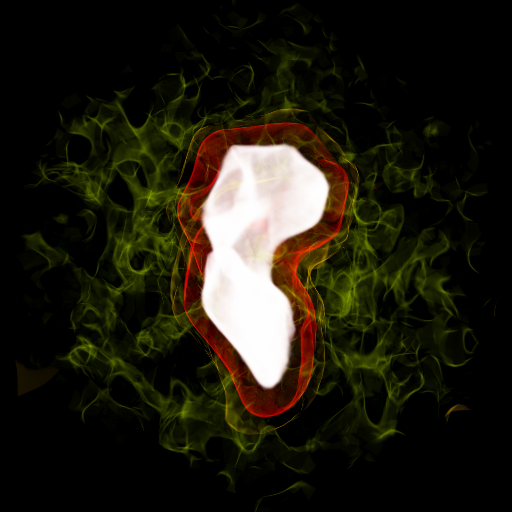

yt : [INFO     ] 2025-02-12 00:09:40,351 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:40,351 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:40,352 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:40,352 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:40,352 Parameters: cosmological_simulation   = 0


gt


yt : [INFO     ] 2025-02-12 00:09:40,555 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:40,562 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:40,562 Creating volume
yt : [INFO     ] 2025-02-12 00:09:40,579 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:40,579 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


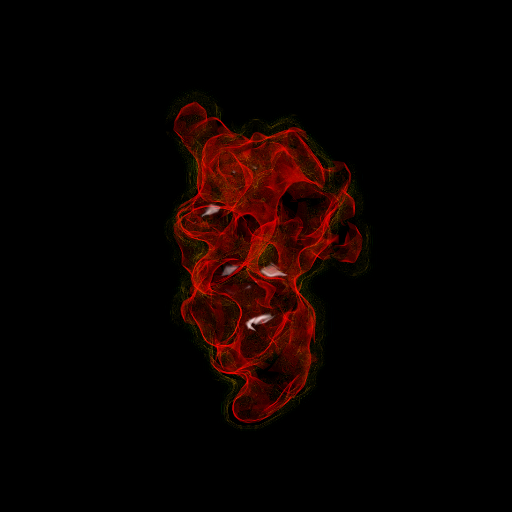

yt : [INFO     ] 2025-02-12 00:09:40,735 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:40,735 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:40,736 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:40,736 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:40,736 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:40,779 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:40,786 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:40,787 Creating volume
yt : [INFO     ] 2025-02-12 00:09:40,803 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:40,803 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


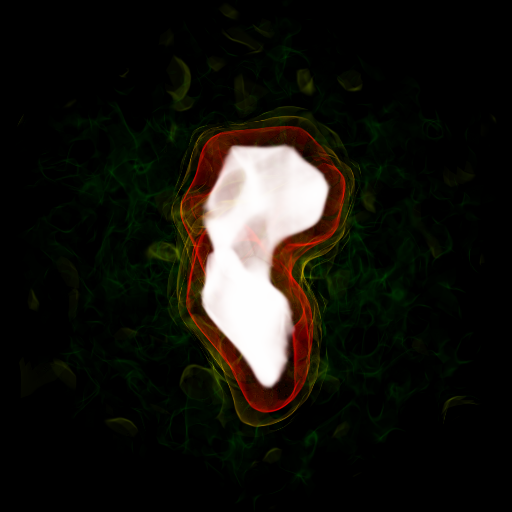

yt : [INFO     ] 2025-02-12 00:09:41,009 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:41,010 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:41,010 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:41,010 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:41,010 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:41,052 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:41,059 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:41,060 Creating volume
yt : [INFO     ] 2025-02-12 00:09:41,076 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:41,076 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


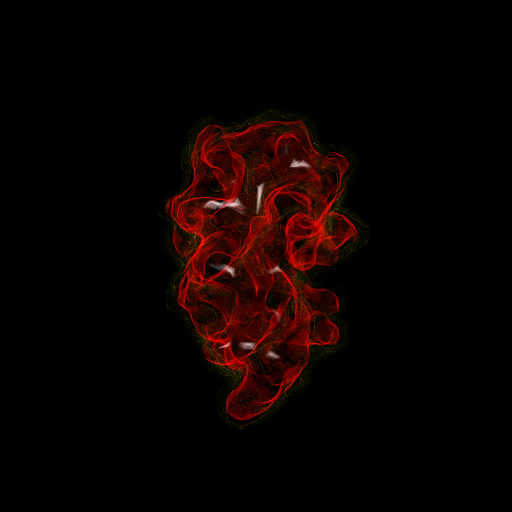

yt : [INFO     ] 2025-02-12 00:09:41,266 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:41,266 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:41,266 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:41,266 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:41,267 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:41,308 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:41,315 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:41,315 Creating volume
yt : [INFO     ] 2025-02-12 00:09:41,332 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:41,332 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


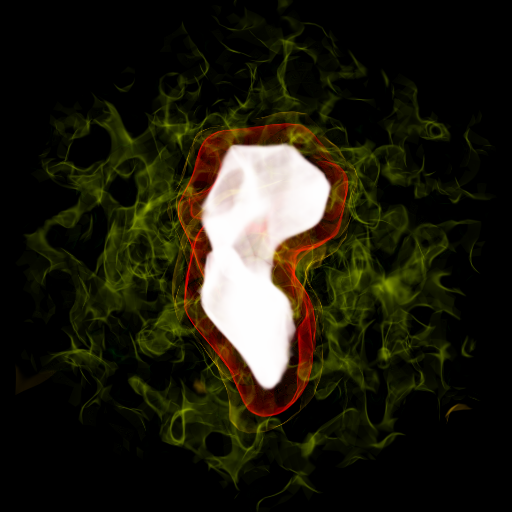

yt : [INFO     ] 2025-02-12 00:09:41,551 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:41,551 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:41,552 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:41,552 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:41,552 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:41,594 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:41,601 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:41,601 Creating volume
yt : [INFO     ] 2025-02-12 00:09:41,618 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:41,618 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


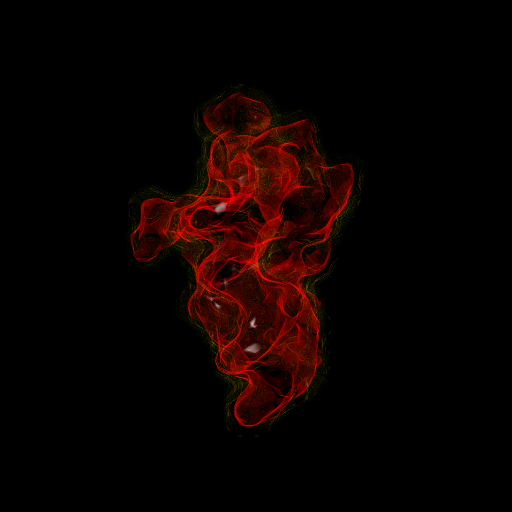

yt : [INFO     ] 2025-02-12 00:09:41,776 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:41,776 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:41,777 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:41,777 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:41,777 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:41,818 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:41,825 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:41,825 Creating volume
yt : [INFO     ] 2025-02-12 00:09:41,842 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:41,842 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


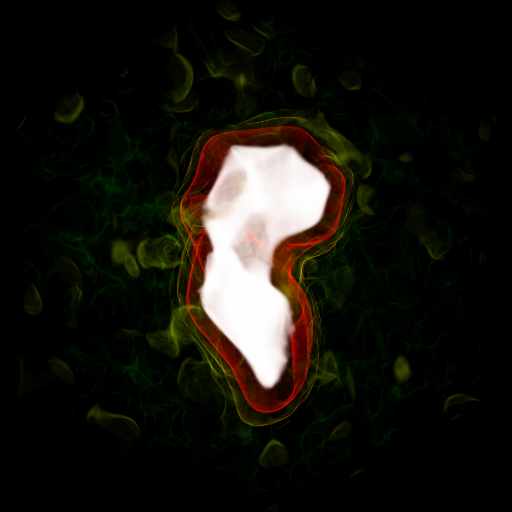

yt : [INFO     ] 2025-02-12 00:09:42,047 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:42,047 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:42,048 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:42,048 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:42,048 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:42,089 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:42,096 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:42,096 Creating volume
yt : [INFO     ] 2025-02-12 00:09:42,112 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:42,112 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


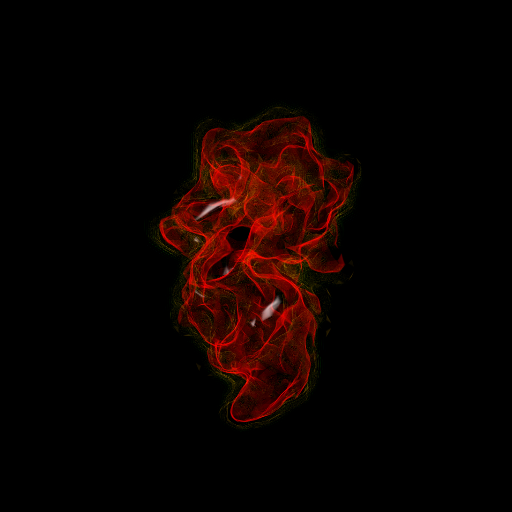

yt : [INFO     ] 2025-02-12 00:09:42,280 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:42,280 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:42,280 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:42,281 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:42,281 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:42,323 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:42,330 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:42,330 Creating volume
yt : [INFO     ] 2025-02-12 00:09:42,346 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:42,347 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


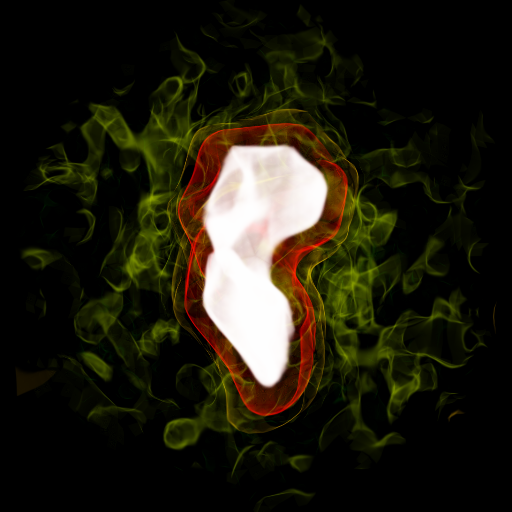

yt : [INFO     ] 2025-02-12 00:09:42,576 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:42,577 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:42,577 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:42,577 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:42,577 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:42,618 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:42,624 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:42,625 Creating volume
yt : [INFO     ] 2025-02-12 00:09:42,641 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:42,641 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


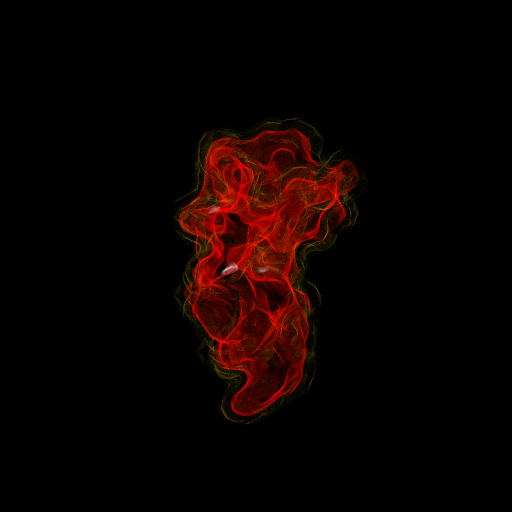

yt : [INFO     ] 2025-02-12 00:09:42,806 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:42,806 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:42,807 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:42,807 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:42,807 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:42,848 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:42,854 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:42,855 Creating volume
yt : [INFO     ] 2025-02-12 00:09:42,871 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:42,871 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


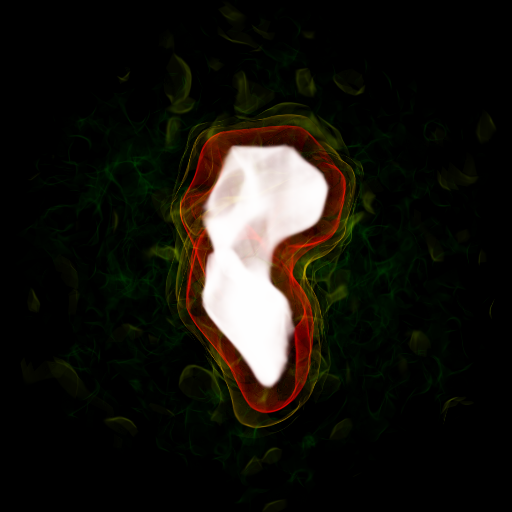

yt : [INFO     ] 2025-02-12 00:09:43,083 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:43,083 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:43,083 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:43,083 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:43,084 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:43,124 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:43,131 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:43,132 Creating volume
yt : [INFO     ] 2025-02-12 00:09:43,147 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:43,147 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


gt


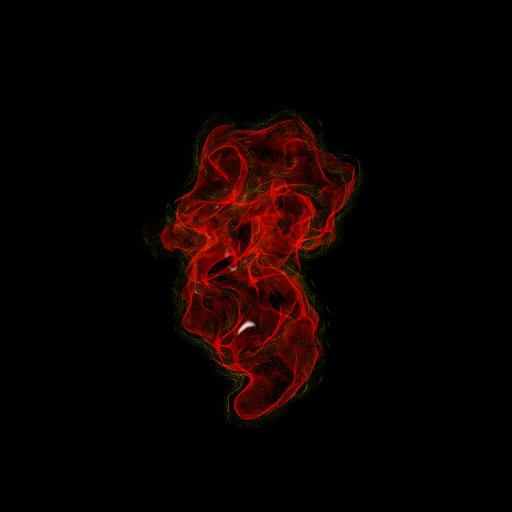

In [37]:
i = 0
for batch in dl_test:
    latent = autoencoder.encode(batch.cuda())
    reconstructed = autoencoder.predict(latent).cpu().detach()
    
    for r in reconstructed:
        plot_field(r.flatten(3)[:, :, :, 0]).show()
        print("gt")
        plot_field(fd[i][:, :, :, 0]).show()
        i += 1

In [38]:
def interp(arr1, arr2, num_points):
    fractions = np.linspace(0, 1, num_points)
    return np.array([arr1 + (arr2 - arr1) * f for f in fractions])

yt : [INFO     ] 2025-02-12 00:09:46,425 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:46,426 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:46,426 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:46,427 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:46,427 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:46,469 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:46,475 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:46,476 Creating volume
yt : [INFO     ] 2025-02-12 00:09:46,492 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:46,493 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


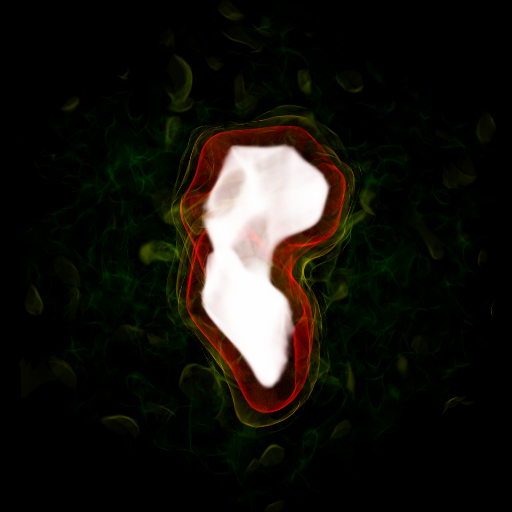

yt : [INFO     ] 2025-02-12 00:09:46,704 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:46,704 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:46,704 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:46,704 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:46,705 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:46,749 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:46,756 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:46,757 Creating volume
yt : [INFO     ] 2025-02-12 00:09:46,773 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:46,773 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


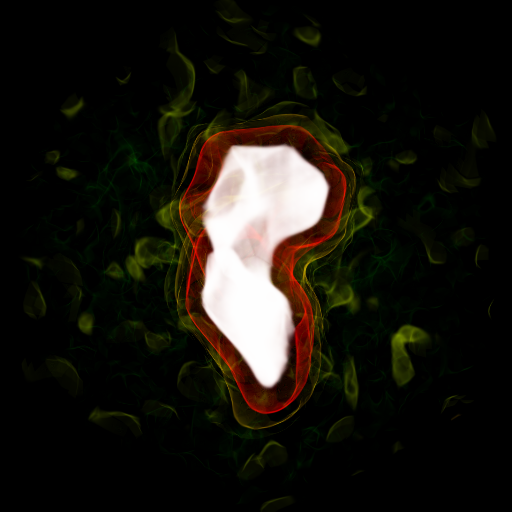

yt : [INFO     ] 2025-02-12 00:09:46,996 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:46,996 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:46,996 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:46,996 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:46,997 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:47,038 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:47,044 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:47,045 Creating volume
yt : [INFO     ] 2025-02-12 00:09:47,062 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:47,062 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


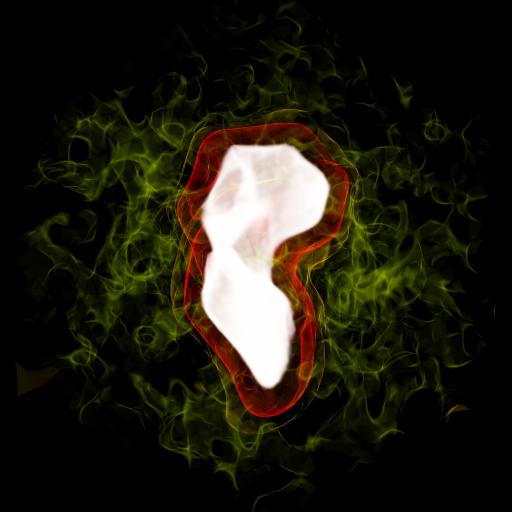

yt : [INFO     ] 2025-02-12 00:09:47,267 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:47,268 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:47,268 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:47,268 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:47,268 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:47,310 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:47,317 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:47,318 Creating volume
yt : [INFO     ] 2025-02-12 00:09:47,335 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:47,335 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


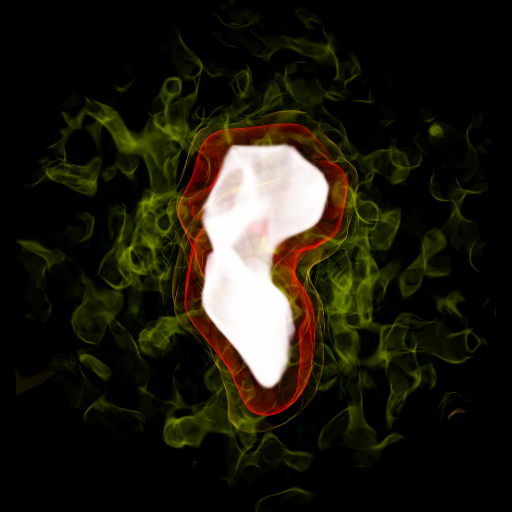

yt : [INFO     ] 2025-02-12 00:09:47,549 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:47,549 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:47,549 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:47,550 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:47,550 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:47,592 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:47,599 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:47,600 Creating volume
yt : [INFO     ] 2025-02-12 00:09:47,616 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:47,616 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


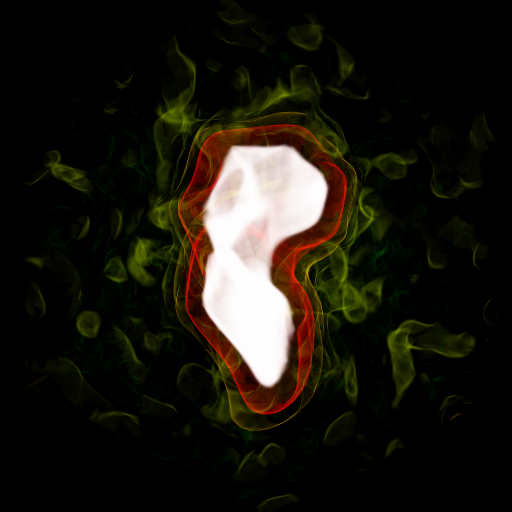

yt : [INFO     ] 2025-02-12 00:09:47,847 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:47,847 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:47,848 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:47,848 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:47,848 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:47,890 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:47,896 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:47,897 Creating volume
yt : [INFO     ] 2025-02-12 00:09:47,914 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:47,914 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


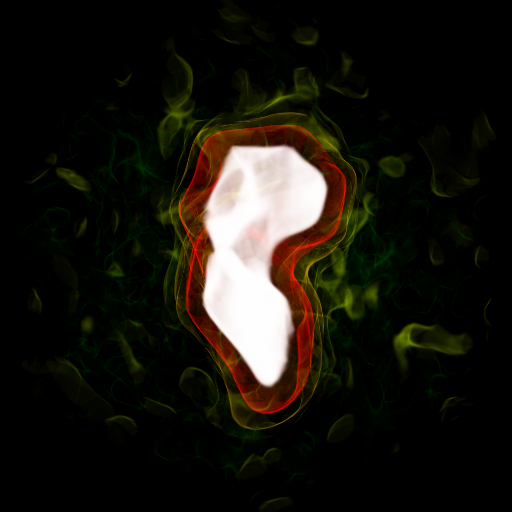

yt : [INFO     ] 2025-02-12 00:09:48,144 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:48,144 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:48,145 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:48,145 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:48,145 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:48,186 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:48,193 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:48,193 Creating volume
yt : [INFO     ] 2025-02-12 00:09:48,210 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:48,210 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


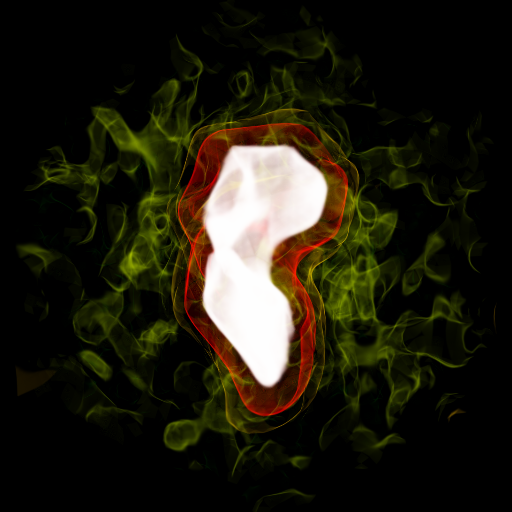

yt : [INFO     ] 2025-02-12 00:09:48,420 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:48,420 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:48,420 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:48,420 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:48,420 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:48,462 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:48,468 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:48,469 Creating volume
yt : [INFO     ] 2025-02-12 00:09:48,485 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:48,485 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


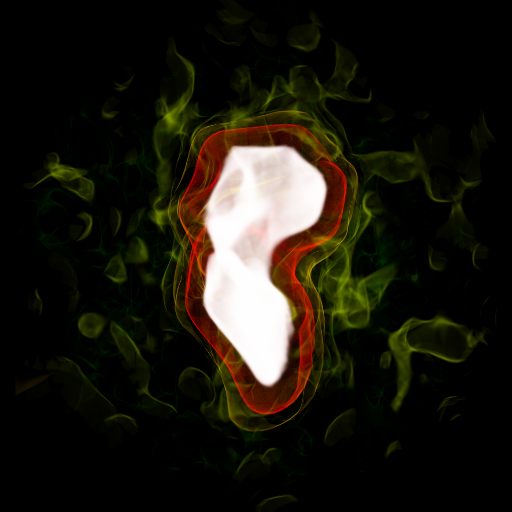

yt : [INFO     ] 2025-02-12 00:09:48,718 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:48,719 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:48,719 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:48,719 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:48,719 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:48,761 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:48,767 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:48,768 Creating volume
yt : [INFO     ] 2025-02-12 00:09:48,785 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:48,785 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


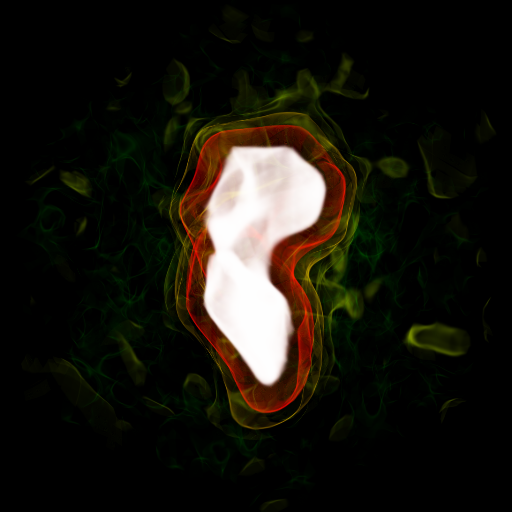

yt : [INFO     ] 2025-02-12 00:09:49,017 Parameters: current_time              = 0.0
yt : [INFO     ] 2025-02-12 00:09:49,017 Parameters: domain_dimensions         = [32 32 32]
yt : [INFO     ] 2025-02-12 00:09:49,017 Parameters: domain_left_edge          = [0. 0. 0.]
yt : [INFO     ] 2025-02-12 00:09:49,018 Parameters: domain_right_edge         = [1. 1. 1.]
yt : [INFO     ] 2025-02-12 00:09:49,018 Parameters: cosmological_simulation   = 0
yt : [INFO     ] 2025-02-12 00:09:49,059 Setting default field to ('gas', 'density')
yt : [INFO     ] 2025-02-12 00:09:49,066 Rendering scene (Can take a while).
yt : [INFO     ] 2025-02-12 00:09:49,067 Creating volume
yt : [INFO     ] 2025-02-12 00:09:49,083 Creating transfer function
yt : [INFO     ] 2025-02-12 00:09:49,083 Calculating data bounds. This may take a while. Set the TransferFunctionHelper.bounds to avoid this.


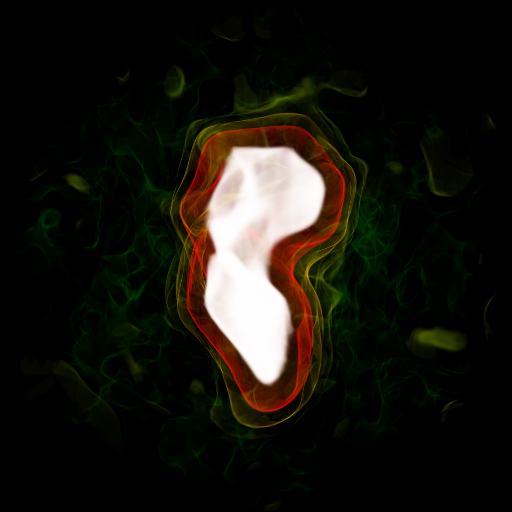

In [39]:
latents = []

for batch in dl_test:
    lats = autoencoder.encode(batch.cuda())
    for lat in lats:
        latents.append(lat.cpu().detach())

latents_intrp = interp(latents[0], latents[5], 10)
reconstructed = autoencoder.predict(torch.FloatTensor(latents_intrp).cuda()).cpu().detach()

for r in reconstructed:
    reconstructed = reconstructed.cpu().detach().squeeze(-1)
    plot_field(r.flatten(3)[:, :, :, 0]).show()